In [1]:
import os
import torch
import torch.nn.functional as F
import numpy as np                 # import numpy
import matplotlib.pyplot as plt    # import matplotlib
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim
from tqdm import tqdm
import h5py
import scipy
from scipy.signal import find_peaks
from IPython.display import Image
import mplcursors
import matplotlib


use_cuda = torch.cuda.is_available()
device = torch.device("cuda:0" if use_cuda else "cpu")
print(device)
samp_rate = 30000.475314
N_samples = 200000
mplcursors.cursor(hover=True, multiple=True)
torch.cuda.empty_cache()

cuda:0


# Cluster dataset

In [2]:
cluster_path = r"C:\Users\yonatan.kle\OneDrive - Technion\Desktop\homework\hadas_proj\Clusters.mat"
cluster_data = scipy.io.loadmat(cluster_path)

In [3]:
spike_TS = cluster_data['Clusters']['TS'][0,0][0]
KSlabel = cluster_data['Clusters']['KSlabel'][0,0][0]
spike_TS = np.array(spike_TS)


In [4]:
Spike_TS = {}
for i in range(len(spike_TS)):
    s = np.array(np.round(spike_TS[i].flatten()*samp_rate).astype(int))
    values = np.isin(np.arange(1, N_samples), s).astype(int)
    Spike_TS[f'Cluster_{i}'] = {
        'SpikeTS': values,
        'KSlabel': KSlabel[i][0]
    }


In [5]:
print(Spike_TS)

{'Cluster_0': {'SpikeTS': array([0, 0, 0, ..., 0, 0, 0]), 'KSlabel': 'mua'}, 'Cluster_1': {'SpikeTS': array([0, 0, 0, ..., 0, 0, 0]), 'KSlabel': 'mua'}, 'Cluster_2': {'SpikeTS': array([0, 0, 0, ..., 0, 0, 0]), 'KSlabel': 'mua'}, 'Cluster_3': {'SpikeTS': array([0, 0, 0, ..., 0, 0, 0]), 'KSlabel': 'mua'}, 'Cluster_4': {'SpikeTS': array([0, 0, 0, ..., 0, 0, 0]), 'KSlabel': 'mua'}, 'Cluster_5': {'SpikeTS': array([0, 0, 0, ..., 0, 0, 0]), 'KSlabel': 'mua'}, 'Cluster_6': {'SpikeTS': array([0, 0, 0, ..., 0, 0, 0]), 'KSlabel': 'mua'}, 'Cluster_7': {'SpikeTS': array([0, 0, 0, ..., 0, 0, 0]), 'KSlabel': 'mua'}, 'Cluster_8': {'SpikeTS': array([0, 0, 0, ..., 0, 0, 0]), 'KSlabel': 'mua'}, 'Cluster_9': {'SpikeTS': array([0, 0, 0, ..., 0, 0, 0]), 'KSlabel': 'mua'}, 'Cluster_10': {'SpikeTS': array([0, 0, 0, ..., 0, 0, 0]), 'KSlabel': 'mua'}, 'Cluster_11': {'SpikeTS': array([0, 0, 0, ..., 0, 0, 0]), 'KSlabel': 'mua'}, 'Cluster_12': {'SpikeTS': array([0, 0, 0, ..., 0, 0, 0]), 'KSlabel': 'mua'}, 'Cluster

# imaging dataset

In [6]:
imaging_path = r"C:\Users\yonatan.kle\OneDrive - Technion\Desktop\homework\hadas_proj\data_for_200k_samp.mat"

In [7]:
class load_neuropixel_dataset(Dataset):
    def __init__(self, path):
        self.y = scipy.io.loadmat(imaging_path)
        self.y = torch.tensor(self.y['dataArray'][:,:])
        self.y = np.array(self.y)
        self.y = self.y - np.median(self.y, axis=0, keepdims=True)
        self.y = self.y[160:161,:]
        self.y = torch.tensor(self.y)
        self.y = self.y.float()
        self.y = torch.unsqueeze(self.y, 1)

    def __len__(self):
        return len(self.y)

    def __getitem__(self, idx):
        return self.y[idx]

# create dataset
dataset = load_neuropixel_dataset(imaging_path)
print(dataset[0].shape)
print(len(dataset))

torch.Size([1, 200000])
1


In [8]:
y = dataset[0][0]
y_noise = np.array(y[:1000])
y_sig = np.array(y[18000:20000])
noise_std = np.std(y_noise)
sig_std = np.std(y_sig)

snr = round(10 * np.log10((sig_std ** 2) / (noise_std ** 2)),2)

print(f"The Signal-to-Noise Ratio (SNR) is: {snr} dB")

The Signal-to-Noise Ratio (SNR) is: 1.48 dB


In [9]:
def count_nonzero_segments(arr):
    count = 0
    in_segment = False

    for value in arr:
        if value > 0:
            if not in_segment:
                count += 1
                in_segment = True
        else:
            in_segment = False

    return count

# CRSAE Model

In [10]:
def vis_code(x):
    x = x.clone().detach().cpu().numpy()
    color = ["b", "r"]
    plt.figure(figsize=(20,3))
    for c in range(x.shape[0]):
        xc = x[c,:]
        nz_x = np.where(xc>0)[0]
        plt.plot(np.zeros(xc.shape), "black")
        plt.stem(nz_x, xc[nz_x], label="x{}".format(c+1), linefmt="{}".format(color[c]), markerfmt="o{}".format(color[c]), basefmt="black", use_line_collection=True)
        plt.legend()
        plt.xlabel("Time [ms]")
    return

def vis_code_est(x, xhat):
    x = x.clone().detach().cpu().numpy()
    xhat = xhat.clone().detach().cpu().numpy()
    color = ["b", "r"]
    plt.figure(figsize=(20,3))

    for c in range(x.shape[0]):
        xc = x[c,:]
        nz_x = np.where(xc>0)[0]
        plt.plot(np.zeros(xc.shape), "black")
        plt.stem(nz_x, xc[nz_x], label="x{}".format(c+1), linefmt="black", markerfmt="o{}".format(color[c]), basefmt="black", use_line_collection=True)
        xchat = xhat[c,:]
        nz_xhat = np.where(xchat>0)[0]
        plt.stem(nz_xhat, xchat[nz_xhat], label="xhat{}".format(c+1), linefmt="-.{}".format(color[c]), markerfmt="*{}".format(color[c]), basefmt="black", use_line_collection=True)
        plt.legend()
        plt.title("x")
        plt.legend()
        plt.xlabel("Time [ms]")
    return

def vis_filters(h):
    h = h.clone().detach().cpu().numpy()
    color = ["b", "r","y","g"]
    plt.figure(figsize=(5,2))
    for c in range(h.shape[0]):
        plt.plot(h[c,0,:], label="true", color=color[c])
    plt.title("h")
    plt.xlabel("Time [ms]")
    return

def vis_filter_est(h, h_init, h_hat):
    if h is not None:
      h = h.clone().detach().cpu().numpy()
    h_init = h_init.clone().detach().cpu().numpy()
    h_hat = h_hat.clone().detach().cpu().numpy()
    color = ["b", "r"]
    plt.figure(figsize=(15,3))
    for c in range(h_init.shape[0]):
        plt.subplot(1,h_init.shape[0],c+1)
        if h is not None:
          plt.plot(h[c,0,:], label="true", color="black")
        plt.plot(h_init[c,0,:], "--", label="init", color="gray")
        plt.plot(h_hat[c,0,:], label="est", color=color[c])
        plt.title("h{}".format(c+1))
        plt.xlabel("Time [ms]")
        plt.legend()
    return

def vis_data(y):
    y = y.clone().detach().cpu().numpy()
    plt.figure(figsize=(20,3))
    plt.plot(y, label="raw", color="black")
    plt.title("y")
    plt.xlabel("Time [ms]")
    plt.legend()
    return

def vis_data_est(y,y_hat):
    y = y.clone().detach().cpu().numpy()
    y_hat = y_hat.clone().detach().cpu().numpy()
    plt.figure(figsize=(20,3))
    plt.plot(y, label="raw", color="black")
    plt.plot(y_hat, label="denoised", color="orange")
    plt.title("y")
    plt.xlabel("Time [ms]")
    plt.legend()
    return

def vis_data_separated_est(hx1,hx2):
    hx1 = hx1.clone().detach().cpu().numpy()
    hx2 = hx2.clone().detach().cpu().numpy()
    color = ["b", "r"]
    plt.figure(figsize=(20,3))
    plt.plot(hx1, label="1", color=color[0])
    plt.plot(hx2, label="2", color=color[1])
    plt.title("y")
    plt.xlabel("Time [ms]")
    plt.legend()

def vis_miss_false(missed_per_list, false_per_list):
  plt.figure(figsize=(10,5))
  plt.plot(missed_per_list, false_per_list, color="black", label="CRsAE")
  plt.xlabel("True Miss [%]")
  plt.ylabel("False Alarm [%]")
  plt.ylim(0,1.1*np.max(false_per_list))
  plt.xlim(0,1.1*np.max(missed_per_list))
  plt.legend()
  return

def load_filters(device):
    return torch.load("data/h_sim_2.pt").to(device)

def load_h_init_harris(device):
    return torch.load("data/h_init_harris.pt").to(device)

def load_y_harris(device):
    return torch.load("data/y_harris.pt").to(device)

def load_y_series_harris(device):
    return torch.load("data/y_series_harris.pt").to(device)

# create distance measure for dictionary
def compute_err_h(h, h_hat):
    h = h.clone().detach()
    h_hat = h_hat.clone().detach()

    err = torch.zeros(h.shape[0])
    for c in range(h.shape[0]):
        corr = torch.sum(h[c, 0, :] * h_hat[c, 0, :])
        err[c] = torch.sqrt(torch.abs(1 - corr) ** 2)
    return err

def initialize_filter(H):
  flag = 1
  while flag:
    H_init = H + 0.4 * torch.randn(H.shape, device=device)
    H_init = F.normalize(H_init, p=2, dim=-1)
    if torch.max(compute_err_h(H, H_init)) < 0.5:
      if torch.min(compute_err_h(H, H_init)) > 0.4:
        flag = 0

  return H_init

In [11]:
class CRsAE1D(torch.nn.Module):
    def __init__(self, hyp, H=None):
        super(CRsAE1D, self).__init__()

        self.T = hyp["T"]            # number of encoder unfolding
        self.L = hyp["L"]            # 1/L is the step size in the encoder
        self.C = hyp["C"]            # number of filters
        self.K = hyp["K"]            # legnth of the filters
        self.lam = hyp["lam"]        # lambda (regularization parameter)
        self.device = hyp["device"]  # device (i.e., cpu, cuda0)

        # initialize the filter H
        if H is None:
            # initialize with random normal
            H = torch.randn((self.C, 1, self.K), device=self.device)
            # normalize that each filter has norm 1
            H = F.normalize(H, p=2, dim=-1)
        # register the filters as weights of
        # the neural network so that to be trainable.
        self.register_parameter("H", torch.nn.Parameter(H))
        # create ReLU
        self.relu = torch.nn.ReLU()

    def get_param(self, name):
        # get parameters with name
        return self.state_dict(keep_vars=True)[name]

    def normalize(self):
        # normalize the filters
        self.get_param("H").data = F.normalize(self.get_param("H").data, p=2, dim=-1)

    def H_operator(self, x):
        return F.conv_transpose1d(x, self.get_param("H"))

    def HT_operator(self, x):
        return F.conv1d(x, self.get_param("H"))

    def encoder(self, y):
        enc_dim = F.conv1d(y, self.get_param("H")).shape[-1]

        x_old = torch.zeros(y.shape[0], self.C, enc_dim, device=self.device)
        x_tmp = torch.zeros(y.shape[0], self.C, enc_dim, device=self.device)
        x_new = torch.zeros(y.shape[0], self.C, enc_dim, device=self.device)
        s_old = torch.tensor(1, device=self.device).float()

        # T recurrent steps
        for t in range(self.T):
            res = y - self.H_operator(x_tmp)
            x_new = x_tmp + self.HT_operator(res) / self.L

            x_new = self.relu(x_new - self.lam / self.L)

            s_new = (1 + torch.sqrt(1 + 4 * s_old * s_old)) / 2
            x_tmp = x_new + (s_old - 1) / s_new * (x_new - x_old)

            x_old = x_new
            s_old = s_new
        return x_new

    def decoder(self, x):
        return F.conv_transpose1d(x, self.get_param("H"))

    def forward(self, y):
        # encoder
        x = self.encoder(y)
        # decoder
        y_hat = self.decoder(x)
        return y_hat, x

    def separate(self,y):
        with torch.no_grad():
            # encoder
            x = self.encoder(y)

            hx_separate = torch.zeros((y.shape[0], self.C, y.shape[-1]), device=self.device)
            for c in range(self.C):
                xc = torch.unsqueeze(x[:,c,:], dim=1)
                hc = torch.unsqueeze(self.get_param("H")[c,:,:],dim=0)
                hx_separate[:,c,:] =  torch.squeeze(F.conv_transpose1d(xc, hc),dim=1)

        return hx_separate

In [12]:

# fill in the gaps
net_hyp = {"T": 800,                 # number of encoder unfolding
           "L": 10,                  # 1/L is the step size in the encoder
           "C": 3,                 # number of filters
           "K": 20,                  # legnth of the filters
           "lam": 60,
           "device": device
           }

# create the newtork with hyperparameters define above, and also H=H_init
net = CRsAE1D(net_hyp)


# training parameters
train_hyp = {"batch_size": 1, "num_epochs": 20, "lr": 1e-3, "shuffle": True}
# data loader
train_loader = DataLoader(dataset, shuffle=train_hyp["shuffle"], batch_size=train_hyp["batch_size"])

# criterion
criterion = torch.nn.MSELoss()

# optimizer
optimizer = optim.Adam(net.parameters(), lr=train_hyp["lr"], eps=1e-3)

In [13]:
lams = [30]
number_of_spikes = []

In [14]:

for lam in lams:
    print("\n start training!")
    net_hyp = {"T": 800,                 # number of encoder unfolding
           "L": 10,                  # 1/L is the step size in the encoder
           "C": 2,                 # number of filters
           "K": 15,                  # legnth of the filters
           "lam": lam,
           "device": device
           }
    net = CRsAE1D(net_hyp)
    # each loop is one pass over the whole dataset
    for epoch in tqdm(range(train_hyp["num_epochs"]), disable=True):
        loss_all = 0
        # each loop is a mini-batch
        for idx, y in tqdm(enumerate(train_loader), disable=False):
            # load data input the device
            y = y.to(device)
    
            # run the network in forward net(y) to get y_hat and x_hat
            y_hat, _= net(y)
    
            # compute loss using the created criterion
            loss = criterion(y, y_hat)
            loss_all += float(loss.item())

            # set the gradients in the optimizer to zero (optimizer.zero_grad())
            optimizer.zero_grad()
            # do backward on the loss
            loss.backward()
            # take a step with the optimizer
            optimizer.step()
    
            # normalize filters
            net.normalize()
    
            #err_h = compute_err_h(dataset.H, net.get_param("H"))
        print("Epoch [{}/{}]loss:{:.4f}\n".format(epoch+1,train_hyp["num_epochs"],loss_all))
        
    #with torch.no_grad():
    #    yi = dataset[0].to(device)
    #    yi_hat, xi_hat = net(yi)
    #array_xhat0 = xi_hat.detach().cpu().numpy()[0,0]
    #array_xhat1 = xi_hat.detach().cpu().numpy()[0,1]
    #array_xhat2 = xi_hat.detach().cpu().numpy()[0,2]
    #count0 = count_nonzero_segments(array_xhat0)
    #count1 = count_nonzero_segments(array_xhat1)
    #count2 = count_nonzero_segments(array_xhat2)
    #number_of_spikes.append((count0,count1,count2))


 start training!


1it [00:01,  1.85s/it]


Epoch [1/20]loss:725.3093



1it [00:00,  1.79it/s]


Epoch [2/20]loss:725.3093



1it [00:00,  1.92it/s]


Epoch [3/20]loss:725.3093



1it [00:00,  1.91it/s]


Epoch [4/20]loss:725.3093



1it [00:00,  1.85it/s]


Epoch [5/20]loss:725.3093



1it [00:00,  1.96it/s]


Epoch [6/20]loss:725.3093



1it [00:00,  1.96it/s]


Epoch [7/20]loss:725.3093



1it [00:00,  1.80it/s]


Epoch [8/20]loss:725.3093



1it [00:00,  1.94it/s]


Epoch [9/20]loss:725.3093



1it [00:00,  1.96it/s]


Epoch [10/20]loss:725.3093



1it [00:00,  2.01it/s]


Epoch [11/20]loss:725.3093



1it [00:00,  1.81it/s]


Epoch [12/20]loss:725.3093



1it [00:00,  1.90it/s]


Epoch [13/20]loss:725.3093



1it [00:00,  1.97it/s]


Epoch [14/20]loss:725.3093



1it [00:00,  2.00it/s]


Epoch [15/20]loss:725.3093



1it [00:00,  1.96it/s]


Epoch [16/20]loss:725.3093



1it [00:00,  1.96it/s]


Epoch [17/20]loss:725.3093



1it [00:00,  1.80it/s]


Epoch [18/20]loss:725.3093



1it [00:00,  1.96it/s]


Epoch [19/20]loss:725.3093



1it [00:00,  1.81it/s]

Epoch [20/20]loss:725.3093



In [15]:
torch.save(net.state_dict(), 'CRSAE_trained_model11.pth')  # Save the model state_dict


# CNMF results

In [16]:
cnmf_path = r"C:\Users\yonatan.kle\OneDrive - Technion\Desktop\homework\hadas_proj\cnmf_spike_detection_noise01.mat"

In [17]:
cnmf = scipy.io.loadmat(cnmf_path)
cnmf = np.array(cnmf['c_oasis'].flatten())
# Set values smaller than 1e-30 to 0
cnmf[cnmf < 1e-30] = 0

print(count_nonzero_segments(cnmf))


24


# Plot Results

In [18]:
%matplotlib widget

In [51]:
net_hyp = {"T": 800,                 # number of encoder unfolding
           "L": 10,                  # 1/L is the step size in the encoder
           "C": 2,                 # number of filters
           "K": 15,                  # legnth of the filters
           "lam": 23,
           "device": device
           }
model = CRsAE1D(net_hyp)
model.load_state_dict(torch.load('CRSAE_trained_model11.pth'))
model.eval()  # Set the model to evaluation mode

CRsAE1D(
  (relu): ReLU()
)

In [52]:
with torch.no_grad():
    yi = dataset[0].to(device)
    yi_hat, xi_hat = model(yi)


In [53]:
cutoff = 50000

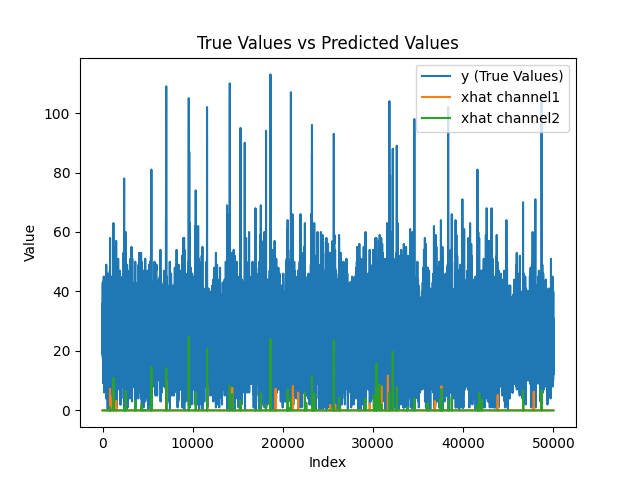

In [54]:
# Create a plot with y and yhat on top of each other
array_y = yi.detach().cpu().numpy()[0]
array_xhat0 = xi_hat.detach().cpu().numpy()[0,0]
array_xhat1 = xi_hat.detach().cpu().numpy()[0,1]
#array_xhat2 = xi_hat.detach().cpu().numpy()[0,2]
plt.figure()
plt.plot(np.abs(array_y[:cutoff]), label='y (True Values)')
plt.plot(array_xhat0[:cutoff], label='xhat channel1')
plt.plot(array_xhat1[:cutoff], label='xhat channel2')
#plt.plot(array_xhat2[:cutoff], label='xhat channel3')
#plt.plot(cnmf[:cutoff]*10, label='CNMF results')


# Add labels and title for better clarity
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('True Values vs Predicted Values')

# Display legend
plt.legend()

# Show the plot
plt.show()


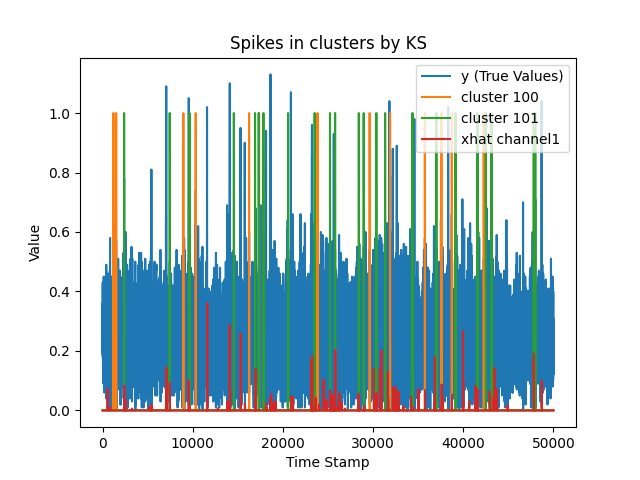

In [23]:
# Create a plot with y and yhat on top of each other

cluster_100 = Spike_TS['Cluster_100']['SpikeTS'][:cutoff]
cluster_101 = Spike_TS['Cluster_101']['SpikeTS'][:cutoff]
plt.figure()
plt.plot(np.abs(array_y[:cutoff]/100), label='y (True Values)')
plt.plot(cluster_100, label='cluster 100')
plt.plot(cluster_101, label='cluster 101')
plt.plot(array_xhat0[:cutoff]/50, label='xhat channel1')

# Add labels and title for better clarity
plt.xlabel('Time Stamp')
plt.ylabel('Value')
plt.title('Spikes in clusters by KS')

# Display legend
plt.legend()

# Show the plot
plt.show()

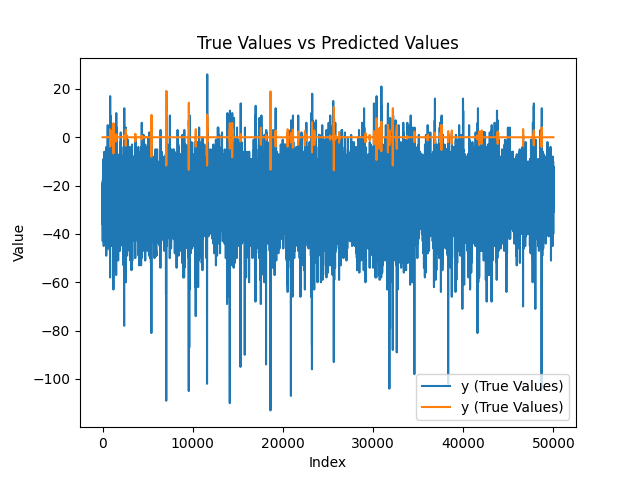

In [55]:
# Create a plot with y and yhat on top of each other
array_y = yi.detach().cpu().numpy()[0]
array_yhat = yi_hat.detach().cpu().numpy()[0,0]

plt.figure()
plt.plot(array_y[:cutoff], label='y (True Values)')
plt.plot(array_yhat[:cutoff], label='y (True Values)')

# Add labels and title for better clarity
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('True Values vs Predicted Values')

# Display legend
plt.legend()

# Show the plot
plt.show()

In [64]:
def print_spike_counts(spike_data, method_name):
    count = count_nonzero_segments(spike_data)
    print(f"Number of spikes found using {method_name}: {count}")

# Assuming Spike_TS, array_xhat0, array_xhat1, array_xhat2, and cnmf are defined

print_spike_counts(Spike_TS['Cluster_100']['SpikeTS'][:20000], 'Kilosort (Cluster 100)')
print_spike_counts(Spike_TS['Cluster_101']['SpikeTS'][:20000], 'Kilosort (Cluster 101)')
print_spike_counts(array_xhat0[:20000], 'CRSAE (xhat0)')
print_spike_counts(array_xhat1[:20000], 'CRSAE (xhat1)')
#print_spike_counts(array_xhat2, 'CRSAE (xhat2)')
print_spike_counts(cnmf[:20000], 'CNMF')

Number of spikes found using Kilosort (Cluster 100): 6
Number of spikes found using Kilosort (Cluster 101): 7
Number of spikes found using CRSAE (xhat0): 8
Number of spikes found using CRSAE (xhat1): 22
Number of spikes found using CNMF: 2


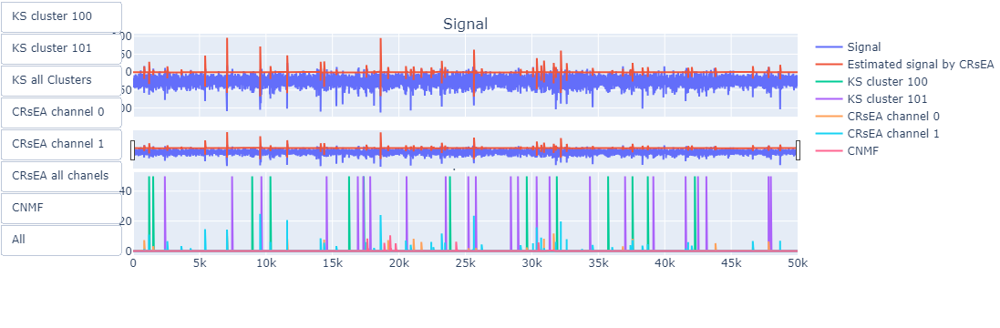

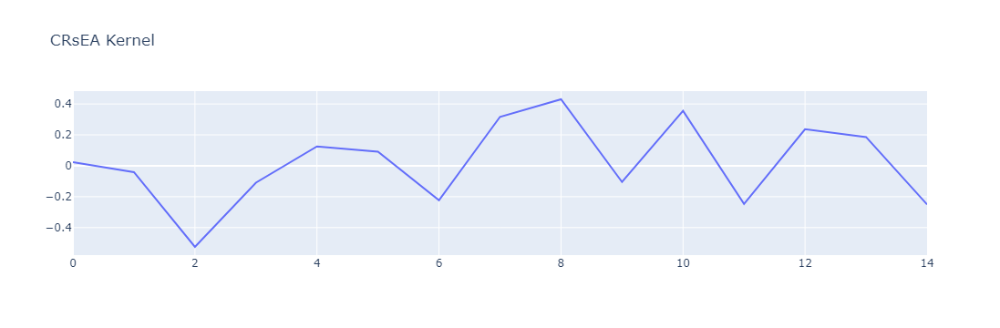

In [66]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import numpy as np
cutoff = 50000
# Assuming you have your 1D signal and different spike data arrays (replace with your actual data)
signal_data = array_y[:cutoff]  # Replace with your 1D signal data
estimated_crsae = array_yhat[:cutoff]
spike_data_method1 = Spike_TS['Cluster_100']['SpikeTS'][:cutoff]*50  
spike_data_method2 = Spike_TS['Cluster_101']['SpikeTS'][:cutoff]*50
spike_data_method3 = array_xhat0[:cutoff]
spike_data_method4 = array_xhat1[:cutoff]
spike_data_method6 = cnmf[:cutoff]  
# Add more spike_data arrays as needed

# kernel from CRsEA
kernel = np.array(model.get_param('H')[1,0].detach().cpu())
# Create a subplot with shared x-axis
fig = make_subplots(rows=2, cols=1, shared_xaxes=True, subplot_titles=['Signal', 'Spikes'])

# Add signal trace
fig.add_trace(go.Scatter(x=np.arange(len(signal_data)), y=signal_data, mode='lines', name='Signal'), row=1, col=1)
fig.add_trace(go.Scatter(x=np.arange(len(signal_data)), y=estimated_crsae*5, mode='lines', name='Estimated signal by CRsEA'), row=1, col=1)


# Add spike data traces (replace with your actual spike data)
fig.add_trace(go.Scatter(x=np.arange(len(spike_data_method1)), y=spike_data_method1, mode='lines', name='KS cluster 100'), row=2, col=1)
fig.add_trace(go.Scatter(x=np.arange(len(spike_data_method2)), y=spike_data_method2, mode='lines', name='KS cluster 101'), row=2, col=1)
fig.add_trace(go.Scatter(x=np.arange(len(spike_data_method3)), y=spike_data_method3, mode='lines', name='CRsEA channel 0'), row=2, col=1)
fig.add_trace(go.Scatter(x=np.arange(len(spike_data_method4)), y=spike_data_method4, mode='lines', name='CRsEA channel 1'), row=2, col=1)
fig.add_trace(go.Scatter(x=np.arange(len(spike_data_method6)), y=spike_data_method6, mode='lines', name='CNMF'), row=2, col=1)

fig_kernel = go.Figure()
fig_kernel.add_trace(go.Scatter(x=np.arange(len(kernel)), y=kernel, mode='lines', name='CRsEA kernel'))
fig_kernel.update_layout(title_text="CRsEA Kernel")



# Update layout for buttons, zooming, and panning
fig.update_layout(
    updatemenus=[
        dict(
            type='buttons',
            direction='down',  # Arrange buttons horizontally
            showactive=False,
            buttons=[
                dict(label='KS cluster 100', method='update', args=[{'visible': [True,False, True, False, False,False,False]}]),
                dict(label='KS cluster 101', method='update', args=[{'visible': [True,False, False, True, False,False,False]}]),
                dict(label='KS all Clusters', method='update', args=[{'visible': [True,False, True, True, False,False,False]}]),
                dict(label='CRsEA channel 0', method='update', args=[{'visible': [True,True, False, False, True,False,False]}]),
                dict(label='CRsEA channel 1', method='update', args=[{'visible': [True,True, False, False, False,True, False]}]),
                dict(label='CRsEA all chanels', method='update', args=[{'visible': [True,True, False, False, True,True, False]}]),
                dict(label='CNMF', method='update', args=[{'visible': [True,False, False, False, False,False,True]}]),
                # Add more buttons for additional methods
                dict(label='All', method='update', args=[{'visible': [True, True, True, True,True,True,True]}]),
            ],
            x=-0.2,
            xanchor='left',
            y=1.15,
            yanchor='top'
        )
    ],
    xaxis=dict(
        rangeslider=dict(
            visible=True
        ),
        type='linear'
    ),
    yaxis=dict(
        autorange=True,
        type='linear'
    ),
    margin=dict(t=0)
)

# Show the plot
fig.show()
fig_kernel.show()


In [61]:
import plotly.io as pio
pio.write_html(fig, 'spike sorting comperison 11.html')

In [28]:
matplotlib.pyplot.close()

In [63]:
plt.plot(np.array(model.get_param('H')[0,0].detach().cpu()))